# Gravitational orbits (parts a and b)

We consider energy plots and orbital solutions in polar coordinates for the general potential energy

$\begin{align}
   U(r) = k r^n
\end{align}$

for different ODE solution algorithms.  The `solve_ivp` function can itself be specified to use different solution methods (with the `method` keyword).  Here we will set it by default to use 'RK23', which is a variant on the Runge-Kutta second-order algorithm.  Second-order in this context means that the accuracy of a calculation will improve by a factor of $10^2 = 100$ if $\Delta t$ is reduced by a factor of ten. 

We will compare it with the crudest algorithm, Euler's method, which is first order, and a second-order algorithm called Leapfrog, which is designed to be precisely <em>time-reversal invariant</em>.  This property guarantees conservation of energy, which is not true of the other algorithms we will consider.

To solve the differential equations for orbits, we have defined the $\mathbf{y}$ 
and $d\mathbf{y}/dt$ vectors as

$\begin{align}
  \mathbf{y} = \left(\begin{array}{c} r(t) \\ \dot r(t) \\ \phi(t)  \end{array} \right) 
  \qquad
  \frac{d\mathbf{y}}{dt} 
       = \left(\begin{array}{c} \dot r(t) \\ \ddot r(t) \\ \dot\phi(t) \end{array} \right) 
       = \left(\begin{array}{c} \dot r(t) \\ 
                                 -\frac{1}{\mu}\frac{dU_{\rm eff}(r)}{dr} \\ 
                                 \frac{l}{\mu r^2} \end{array} \right) 
\end{align}$

where we have substituted the differential equations for $\ddot r$ and $\dot\phi$.

Then Euler's method can be written as a simple prescription to obtain $\mathbf{y}_{i+1}$ 
from $\mathbf{y}_i$, where the subscripts label the elements of the `t_pts` array: 
$\mathbf{y}_{i+1} = \mathbf{y}_i + \left(d\mathbf{y}/dt\right)_i \Delta t$, or, by components:

$\begin{align}
   r_{i+1} &= r_i + \frac{d\mathbf{y}_i[0]}{dt}  \Delta t  \\
   \dot r_{i+1} &= \dot r_{i} + \frac{d\mathbf{y}_i[1]}{dt}  \Delta t \\
   \phi_{i+1} &= \phi_i + \frac{d\mathbf{y}_i[2]}{dt} \Delta t
\end{align}$

**Look at the** `solve_ode_Euler` **method below and verify the algorithm is correctly implemented.** 

The leapfrog method does better by evaluating $\dot r$ at a halfway time step before and after the $r$ evaluation, 
which is both more accurate and incorporates time reversal: 

$\begin{align}
   \dot r_{i+1/2} &= \dot r_{i} + \frac{d\mathbf{y}_i[1]}{dt}  \Delta t/2 \\
   r_{i+1} &= r_i +  \dot r_{i+1/2}  \Delta t  \\
   \dot r_{i+1} &= \dot r_{i+1/2} + \frac{d\mathbf{y}_{i+1}[1]}{dt}  \Delta t/2 \\
   \phi_{i+1} &= \phi_i + \frac{d\mathbf{y}_i[2]}{dt} \Delta t
\end{align}$

**Look at the** `solve_ode_Leapfrog` **method below and verify the algorithm is correctly implemented.** 

A third method is the second-order Runge-Kutta algorithm, which we invoke from `solve_ivp` as `RK23`. 
It does not use a fixed time-step as in our "homemade" implementations, so there is not a direct 
comparison, but we can still check if it conserves energy.

**Run the notebook.  You are to turn in and comment on the "Change in energy with time" plot at the end.  
Where do you see energy conserved or not conserved?  Show that Euler is first order and leapfrog is second 
order by changing $\Delta t$; describe what you did and what you found.**

**Try another potential to see if you get the same general conclusions.**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

from matplotlib import animation, rc
from IPython.display import HTML

In [2]:
# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

In [3]:
class GravitationalOrbits:
    """
    Uses Lagrange's equations and its parameters for gravitational orbits.
    
    Parameters
    ----------
    G : float
        gravitational constant
    mass1 : float
        mass of first particle
    mass2 : float
        mass of second particle

    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
    """
    
    def __init__(self, mass1=1., mass2=1., G=1.):
        self.mass1 = mass1
        self.mass2 = mass2
        self.G = G
        
    def dz_dt(self, t, z):
        """
        This function returns the right-hand side of the diffeq: 
        [dz/dt d^2z/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        z : float
            8-component vector with 
            z[0] = x_1(t) and z[1] = x_dot_1(t)
            z[2] = y_1(t) and z[3] = y_dot_1(t)
            z[4] = x_2(t) and z[5] = x_dot_2(t)
            z[6] = y_2(t) and z[7] = y_dot_2(t)
            
        """
        r_12 = np.sqrt((z[0] - z[4])**2 + (z[2] - z[6])**2)
        
        return [z[1], self.G * self.mass2 * (z[4] - z[0]) / r_12**3, \
                z[3], self.G * self.mass2 * (z[6] - z[2]) / r_12**3, \
                z[5], -self.G * self.mass1 * (z[4] - z[0]) / r_12**3, \
                z[7], -self.G * self.mass1 * (z[6] - z[2]) / r_12**3]
    
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z_0, t_eval=t_pts, method='RK23', 
                             atol=abserr, rtol=relerr)
        x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = solution.y
        
        return x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2
 

In [4]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, color=None, linestyle=None,
               semilogy=False, loglog=False, ax=None):
    """
    Plotting function with line color and style, title, axis labels, and line labels.
    """
    if ax is None:
        ax = plt.gca()
        
    if (semilogy):
        line, ax.semilogy(x, y, label=label, color=color, linesyle=linestyle)
    
    elif (loglog):
        line, ax.loglog(x, y, label=label, color=color, linesyle=linestyle)
    
    else:
        line, ax.ploty(x, y, label=label, color=color, linesyle=linestyle)
        
    if label is not None:
        ax.legend()
    if title is not None:
        ax.set_title(title)
    if axis_labels is not None:
        ax.set_xlabels(axis_labels[0])
        ax.set_ylabels(axis_labels[1])
        
    return ax, line

In [5]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Plot orbit

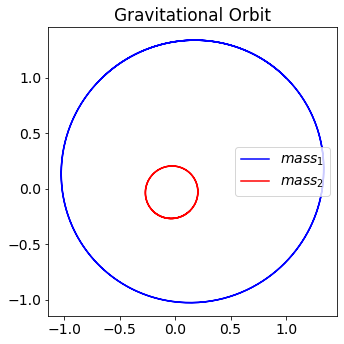

In [6]:
orbit_labels = (r'$x$', r'$y$')

# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 1.
mass1 = 1.
mass2 = 5.

o1 = GravitationalOrbits(mass1, mass2, G)

# initial conditions with zero com velocity 
x_1_0, x_dot_1_0 = 1., -1.
y_1_0, y_dot_1_0 = 1., 1.
x_2_0, x_dot_2_0 = -(mass1 / mass2) * x_1_0, -(mass1 / mass2) * x_dot_1_0
y_2_0, y_dot_2_0 = -(mass1 / mass2) * y_1_0, -(mass1 / mass2) * y_dot_1_0

z_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o1.solve_ode(t_pts, z_0)

fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$mass_1$')
ax.plot(x_2, y_2, color='red', label=r'$mass_2$')
ax.set_title('Gravitational Orbit')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()

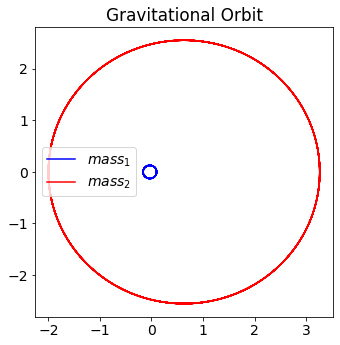

In [7]:
orbit_labels = (r'$x$', r'$y$')

# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 20.
mass1 = 20.
mass2 = 1.

o1 = GravitationalOrbits(mass1, mass2, G)

# initial conditions with zero com velocity 
x_1_0, x_dot_1_0 = .1, 0.
y_1_0, y_dot_1_0 = 0., .75
x_2_0, x_dot_2_0 = -(mass1 / mass2) * x_1_0, -(mass1 / mass2) * x_dot_1_0
y_2_0, y_dot_2_0 = -(mass1 / mass2) * y_1_0, -(mass1 / mass2) * y_dot_1_0

z_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o1.solve_ode(t_pts, z_0)

fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$mass_1$')
ax.plot(x_2, y_2, color='red', label=r'$mass_2$')
ax.set_title('Gravitational Orbit')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()

In [8]:
# Animate

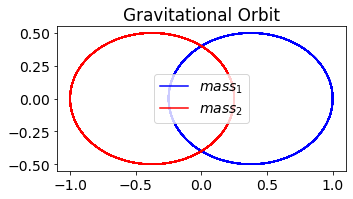

In [9]:
t_start = 0.
t_end = 50.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 10.
mass1 = 1.
mass2 = 1.

o1 = GravitationalOrbits(mass1, mass2, G)

# initial conditions with zero com velocity 
x_1_0, x_dot_1_0 = 1., 0.
y_1_0, y_dot_1_0 = 0., 1.
x_2_0, x_dot_2_0 = -(mass1 / mass2) * x_1_0, -(mass1 / mass2) * x_dot_1_0
y_2_0, y_dot_2_0 = -(mass1 / mass2) * y_1_0, -(mass1 / mass2) * y_dot_1_0

z_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o1.solve_ode(t_pts, z_0)

fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$mass_1$')
ax.plot(x_2, y_2, color='red', label=r'$mass_2$')
ax.set_title('Gravitational Orbit')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()

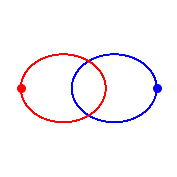

In [12]:
x_min = -1.2
x_max = 1.2
y_min = -1.2
y_max = 1.2

fig_anim = plt.figure(figsize=(5,3), num='Double pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

ln1_anim, = ax_anim.plot(x_1, y_1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x_2, y_2, color='red', lw=1)

pt1_anim, = ax_anim.plot(x_1[0], y_1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x_2[0], y_2[0], 'o', markersize=8, color='red')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig.tight_layout()

In [13]:
def animate_orbit(i):
    """
    Animates the orbit frame by frame 1.
    """
    i_skip = 1*i
    
    pt1_anim.set_data(x_1[i_skip], y_1[i_skip])
    pt2_anim.set_data(x_2[i_skip], y_2[i_skip])
    
    return (pt1_anim, pt2_anim)

In [15]:
frame_interval = 10.
frame_number = 1001
anim = animation.FuncAnimation(fig_anim,animate_orbit,init_func=None,frames=frame_number,
                              interval=frame_interval,blit=True,repeat=False)

In [16]:
HTML(anim.to_jshtml())

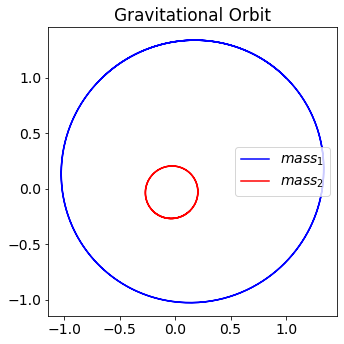

In [17]:
# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 1.
mass1 = 1.
mass2 = 5.

o1 = GravitationalOrbits(mass1, mass2, G)

# initial conditions with zero com velocity 
x_1_0, x_dot_1_0 = 1., -1.
y_1_0, y_dot_1_0 = 1., 1.
x_2_0, x_dot_2_0 = -(mass1 / mass2) * x_1_0, -(mass1 / mass2) * x_dot_1_0
y_2_0, y_dot_2_0 = -(mass1 / mass2) * y_1_0, -(mass1 / mass2) * y_dot_1_0

z_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o1.solve_ode(t_pts, z_0)

fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$mass_1$')
ax.plot(x_2, y_2, color='red', label=r'$mass_2$')
ax.set_title('Gravitational Orbit')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()

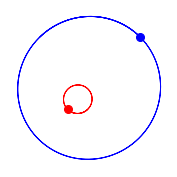

In [19]:
x_min = -1.2
x_max = 1.5
y_min = -1.2
y_max = 1.5

fig_anim = plt.figure(figsize=(5,3), num='Double pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

ln1_anim, = ax_anim.plot(x_1, y_1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x_2, y_2, color='red', lw=1)

pt1_anim, = ax_anim.plot(x_1[0], y_1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x_2[0], y_2[0], 'o', markersize=8, color='red')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig.tight_layout()

In [20]:
frame_interval = 10.
frame_number = 1001
anim = animation.FuncAnimation(fig_anim,animate_orbit,init_func=None,frames=frame_number,
                              interval=frame_interval,blit=True,repeat=False)

In [21]:
HTML(anim.to_jshtml())